# Diseño de filtro FIR - Proyecto final
## Procesamiento Digital de Señales
## Estudiante: Santiago Giraldo Tabares - CC1000763987
### Semestre 2024-1 - Departamento de electrónica y telecomunicaciones
### Facultad de ingeniería - Universidad de Antioquia

nota: ejecutar el Notebook de manera ordenada, debido a que constantemente se reutilizan variables!


nota: conclusiones importantes sobre este trabajo no solo se expresan al final del mismo, sino en las respuestas a las múltiples preguntas que propone la guía.

## Set-Up

In [3]:
#LIBRERÍAS
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import scipy as sp
import IPython as ip
from IPython.display import Audio
from scipy.io.wavfile import write, read
from matplotlib.pylab import *

### Introducción:
#### El siguiente Notebook tiene como propósito explicar el proceso de diseño y puesta a prueba de un filtro de respuesta finita al impulso (Filtro FIR). El diseño del filtro se realiza con base en los algoritmos proporcionados durante el desarrollo del curso de procesamiento digital de señales, con las debidas adecuaciones requeridas para el propósito específico del curso. El siguiente proyecto se compone de los siguientes puntos:

1. Buscar una señal de audio de un instrumento musical
2. Hacer un análisis en frecuencia (FFT, espectrograma) que muestre los rangos de frecuencias en los que se distribuye la señal
3. Realizar los cálculos teóricos del diseño de los filtros (apoyarse en Python para el cálculo de los coeficientes del filtro). Utilizar diferent s filtros (mínimo 3) para que obtengan diferentes tonos de la señal de audio
4. Comparar la señal original y la señal filtrada y observar sus diferencias (visualmente y mediante la correlación)
5. Realizar el filtrado usando las funciones ya definidas en Python (esto lo verán en el último laboratorio)
6. Comparar el diseño teórico y el diseño con las funciones en Python de los diferentes filtros (Utilizar la correlación para comparar las señalpacio.

## 1. Selección de instrumento:
La señal de audio escogida para la aplicación de filtrado, corresponde a acordes simples ejecutados por una guitarra eléctrica en limpio (con las minimas distorsiones y sin efectos añadidos), conectada por linea directa mediante una interfaz de audio hacia la computadora. Los acordes, almacenados como archivos .mp3 en la carpeta raiz del proyecto, corresponden a DO, SOL, DO7 y ---. La señal se capturó con la menor cantidad de ruido de linea eléctrica posible, con el propósito de poder apreciar únicamente las notas que componen los acordes, siendo el propósito del filtro eliminar ciertas notas de cada acorde.

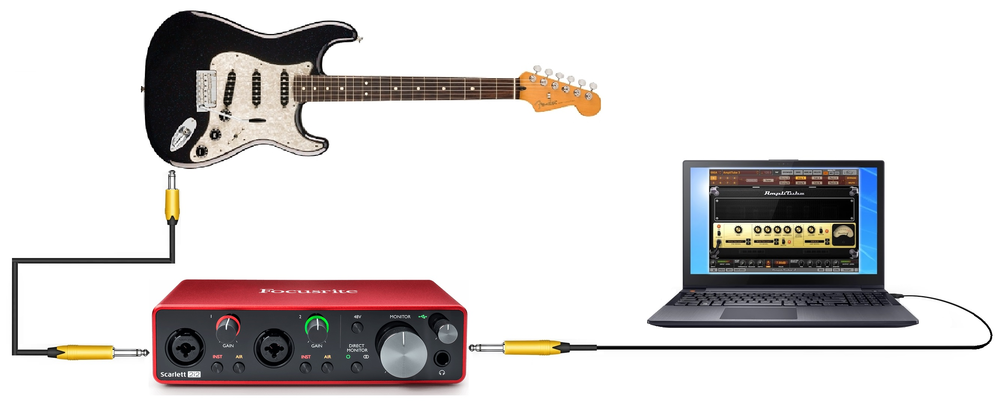

In [4]:
from IPython.display import Image
Image(filename='diagram.png')

Se cargará solo un audio, sin embargo puede cambiarse el nombre del archivo .mp3 para cargar el audio de interés. Por defecto, se analizará el acorde de SOL.

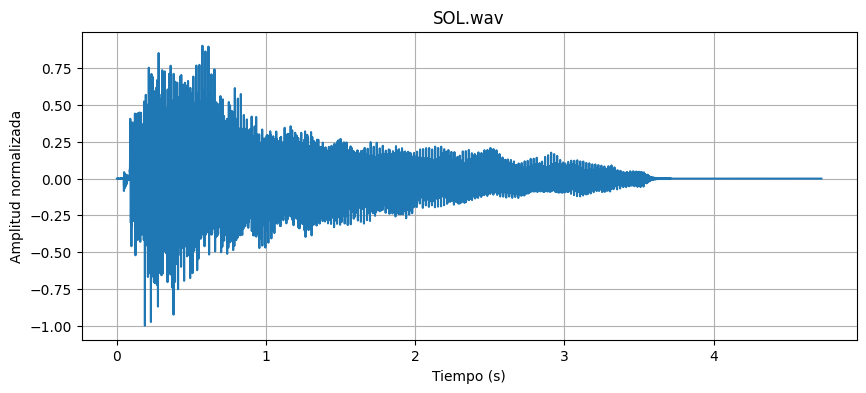

In [5]:
# Cargar el archivo de audio
fs, audio_data = read("SOL.wav")

# Normalizar el audio
normalized_audio = audio_data / np.max(np.abs(audio_data))

# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio)) / fs

# Graficar el audio
plt.figure(figsize=(10, 4))
plt.plot(time_vector, normalized_audio)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud normalizada")
plt.title("SOL.wav")
plt.grid(True)
plt.show()

# Reproducir el audio
Audio(normalized_audio, rate=fs)

## 2. Análisis espectral:
Para ver las componentes armónicas del acorde de muestra, se hace uso de la FFT aplicada en un instante de tiempo en el que estas aún no se han disipado, dentro de la ventana del primer segundo.

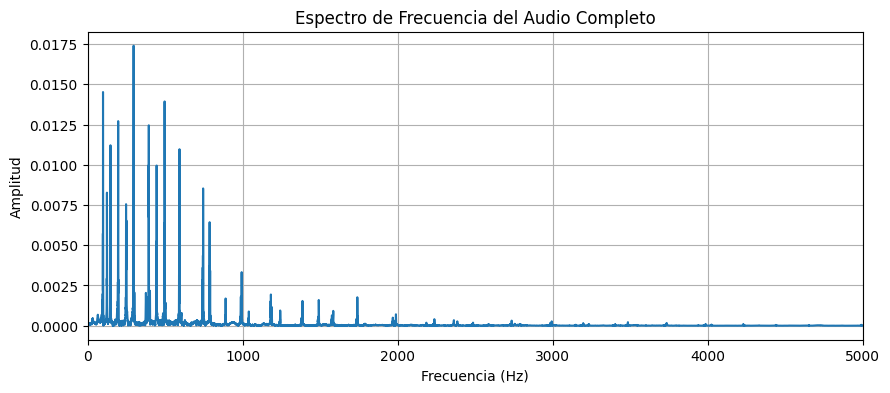

In [6]:
# Realizar la FFT del audio completo
n = len(normalized_audio)
k = np.arange(n)
T = n / fs
frq = k / T  # two sides frequency range
frq = frq[range(n // 2)]  # one side frequency range

Y = np.fft.fft(normalized_audio) / n  # FFT and normalization
Y = Y[range(n // 2)]

# Graficar el espectro de frecuencia
plt.figure(figsize=(10, 4))
plt.plot(frq, abs(Y))
plt.xlabel("Frecuencia (Hz)")
plt.xlim(0,5000)
plt.ylabel("Amplitud")
plt.title("Espectro de Frecuencia del Audio Completo")
plt.grid(True)
plt.show()

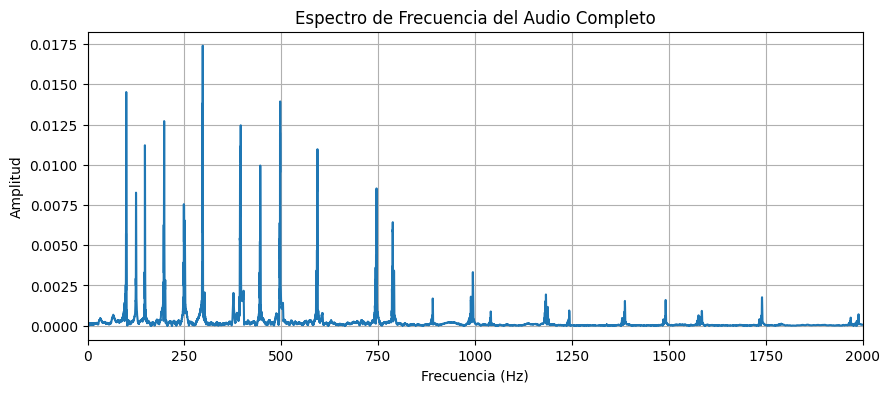

In [7]:
# Graficar el espectro de frecuencia
plt.figure(figsize=(10, 4))
plt.plot(frq, abs(Y))
plt.xlabel("Frecuencia (Hz)")
plt.xlim(0,2000)
plt.ylabel("Amplitud")
plt.title("Espectro de Frecuencia del Audio Completo")
plt.grid(True)
plt.show()

Nóte como el análisis en frecuencia evidencia que este acorde tiene una alta riqueza espectral y armónica, eso si, con toda la información relevante dentro de un rango de frecuencias audibles. Y no solo audibles, sino con un rango de frecuencias que corresponde a notas en los primeros trastes del diapason (las más graves con las que se puede representar el acorde en diapasón de la guitarra):

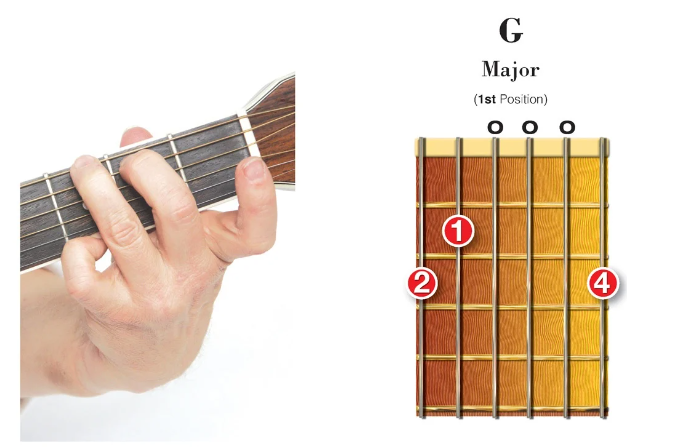

In [8]:
Image(filename='SOL.png')

Las 6 cuerdas corresponden a las siguientes frecuencias:


Para ver el comportamiento de las intensidades correspondientes a cada componente espectral pero en el tiempo, se representa la señal mediante un espectrograma:

/usr/local/lib/python3.13/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


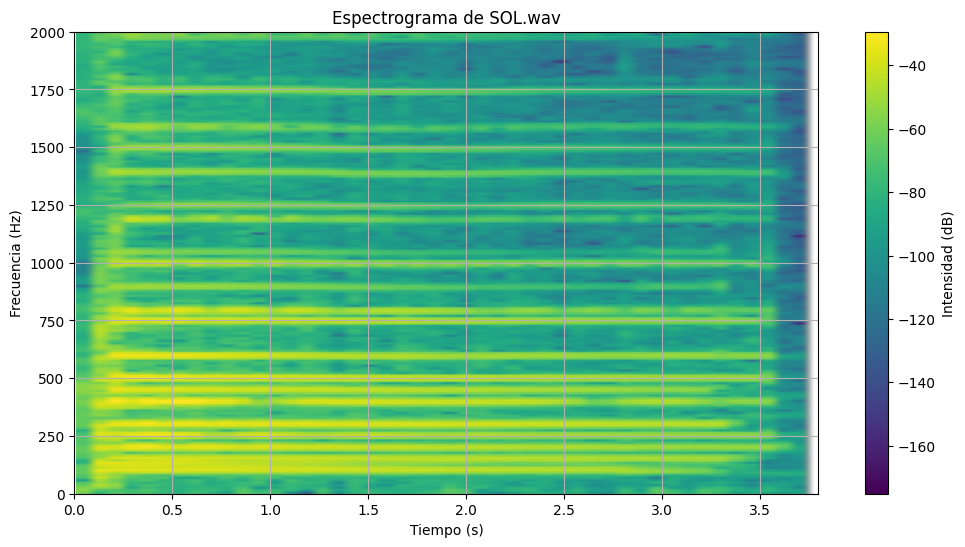

In [9]:
# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio)) / fs

# Reproducir el audio
Audio(normalized_audio, rate=fs)

# Calcular y graficar el espectrograma
plt.figure(figsize=(12, 6))  # Aumentar el tamaño de la figura
plt.specgram(normalized_audio, Fs=fs, NFFT=4096, noverlap=512, cmap='viridis')
plt.ylim(0, 2000)  # Mostrar frecuencias de 0 a 5000 Hz
plt.xlim(0,3.8)
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia (Hz)")
plt.title("Espectrograma de SOL.wav")
plt.colorbar(label='Intensidad (dB)')
plt.grid(True)
plt.show()

Algunas pocas componentes se atenuan progresivamente conforme avanza el tiempo, pero en general el acorde tiene un buen sustain, lo que significa que la mayoria de las notas se mantienen bien durante el tiempo sin atenuarse.

## 3. Diseño de filtro mediante funciones de laboratorio:
A continuación, se emplean los métodos utilizados en el laboratorio para el diseño de los filtros. Los parametros son un una frecuencia de corte de 600Hz para el pasa bajas, una frecuencia de corte de 1200Hz para el pasa altas, y frecuencias de corte de 600 hz y 1200 hz para el pasa bandas. El ripple será de 60 y el rolloff de 200hz para todos los casos, incluidos los teóricos.

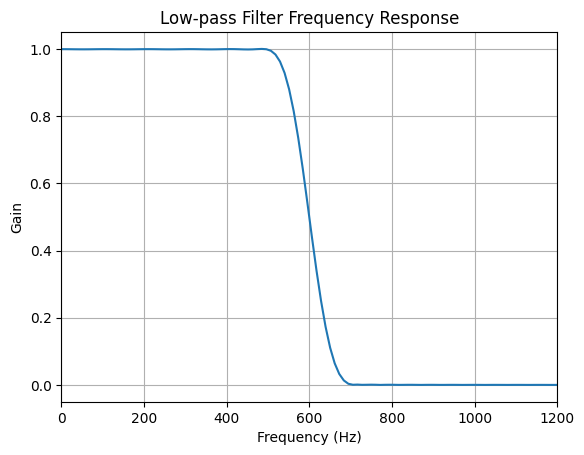

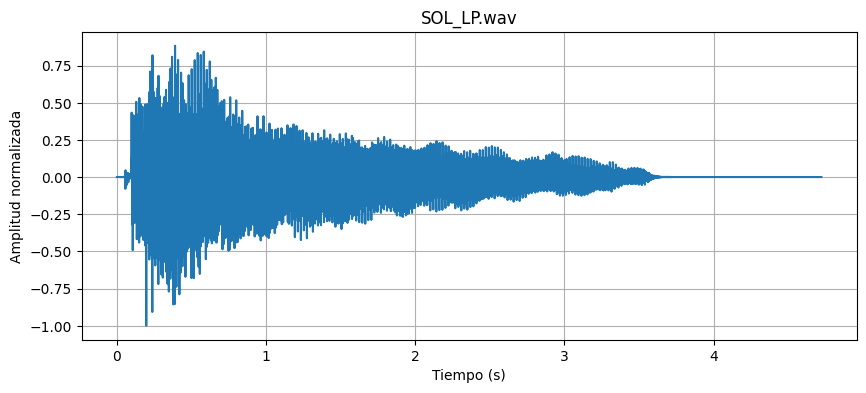

/usr/local/lib/python3.13/dist-packages/matplotlib/axes/_axes.py:8233: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


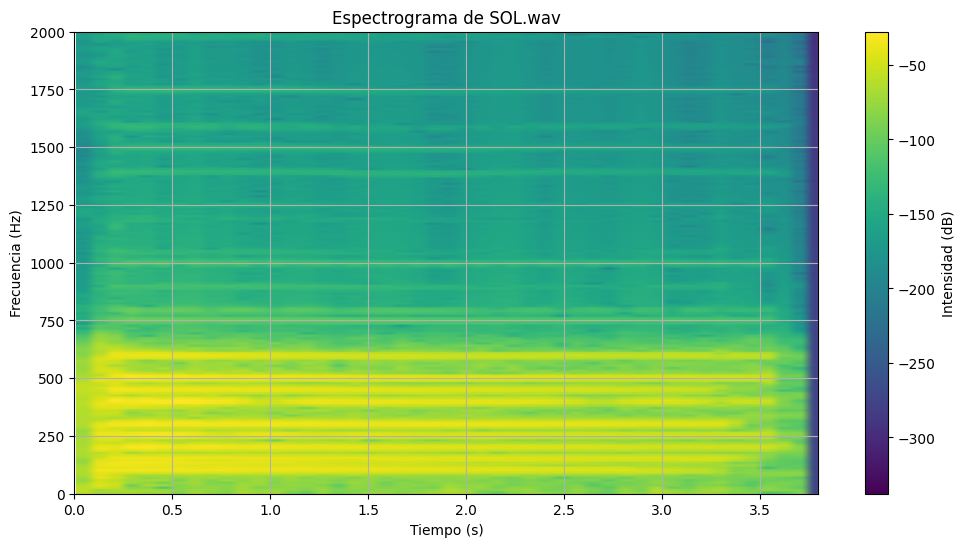

In [10]:
from scipy.signal import kaiserord, lfilter, firwin, freqz

nyq_rate = fs / 2.0
cutoff_hz = 600.0  # Cutoff frequency
roll_off = 200.0  # Roll-off frequency

# Compute width
width = roll_off / nyq_rate

# Desired attenuation in the stop band, in dB
ripple_db = 60.0

# Compute the order and Kaiser parameter for the FIR filter
N, beta = kaiserord(ripple_db, width)

# Create the FIR filter
taps = firwin(N, cutoff_hz / nyq_rate, window=('kaiser', beta), pass_zero=True)

# Compute frequency response
w, h = freqz(taps, worN=2000)

# Plot frequency response
plt.plot(nyq_rate * w / np.pi, np.abs(h))
plt.title('Low-pass Filter Frequency Response')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Gain')
plt.xlim(0,1200)
plt.grid(True)
plt.show()

filtered_lp = lfilter(taps, 1.0, audio_data)

# Normalizar el audio
normalized_audio_lp = filtered_lp / np.max(np.abs(filtered_lp))

# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio_lp)) / fs

# Graficar el audio
plt.figure(figsize=(10, 4))
plt.plot(time_vector, normalized_audio_lp)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud normalizada")
plt.title("SOL_LP.wav")
plt.grid(True)
plt.show()

# Reproducir el audio
Audio(normalized_audio_lp, rate=fs)

# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio_lp)) / fs



# Calcular y graficar el espectrograma
plt.figure(figsize=(12, 6))  # Aumentar el tamaño de la figura
plt.specgram(normalized_audio_lp, Fs=fs, NFFT=4096, noverlap=512, cmap='viridis')
plt.ylim(0, 2000)  # Mostrar frecuencias de 0 a 5000 Hz
plt.xlim(0,3.8)
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia (Hz)")
plt.title("Espectrograma de SOL.wav")
plt.colorbar(label='Intensidad (dB)')
plt.grid(True)
plt.show()

# Reproducir el audio
Audio(normalized_audio_lp, rate=fs)

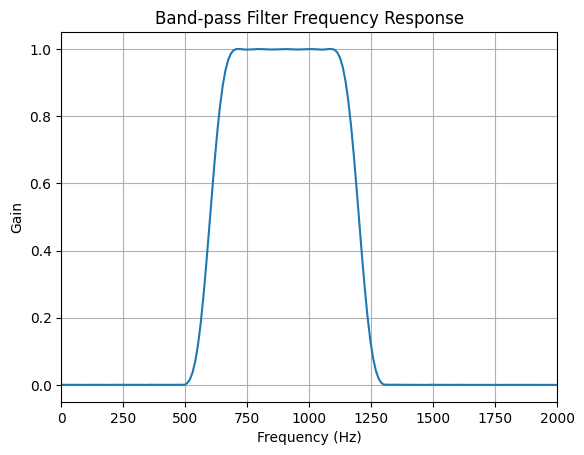

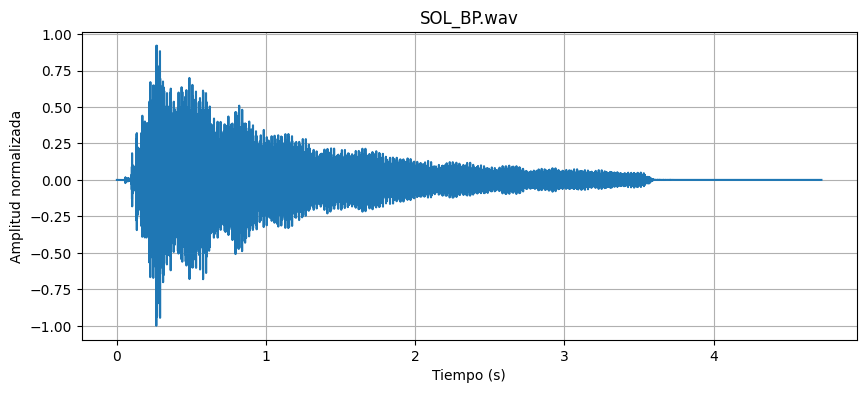

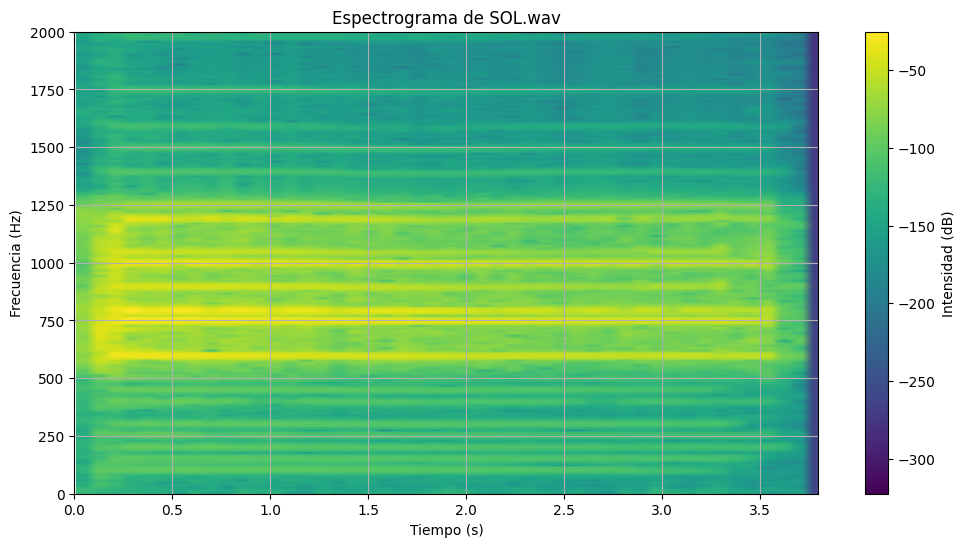

In [11]:
# Parameters

cutoff_hz = [600.0, 1200.0]  # Cutoff frequencies
roll_off = 200.0  # Roll-off frequency

# Create the FIR filter
taps = firwin(N, [cutoff_hz[0] / nyq_rate, cutoff_hz[1] / nyq_rate], window=('kaiser', beta), pass_zero=False)

# Compute frequency response
w, h = freqz(taps, worN=2000)

# Plot frequency response
plt.plot(nyq_rate * w / np.pi, np.abs(h))
plt.title('Band-pass Filter Frequency Response')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Gain')
plt.xlim(0, 2000)
plt.grid(True)
plt.show()

filtered_bp = lfilter(taps, 1.0, audio_data)

# Normalizar el audio
normalized_audio_bp = filtered_bp / np.max(np.abs(filtered_bp))

# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio_bp)) / fs

# Graficar el audio
plt.figure(figsize=(10, 4))
plt.plot(time_vector, normalized_audio_bp)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud normalizada")
plt.title("SOL_BP.wav")
plt.grid(True)
plt.show()



# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio_bp)) / fs

# Reproducir el audio
Audio(normalized_audio_bp, rate=fs)

# Calcular y graficar el espectrograma
plt.figure(figsize=(12, 6))  # Aumentar el tamaño de la figura
plt.specgram(normalized_audio_bp, Fs=fs, NFFT=4096, noverlap=512, cmap='viridis')
plt.ylim(0, 2000)  # Mostrar frecuencias de 0 a 5000 Hz
plt.xlim(0,3.8)
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia (Hz)")
plt.title("Espectrograma de SOL.wav")
plt.colorbar(label='Intensidad (dB)')
plt.grid(True)
plt.show()

# Reproducir el audio
Audio(normalized_audio_bp, rate=fs)

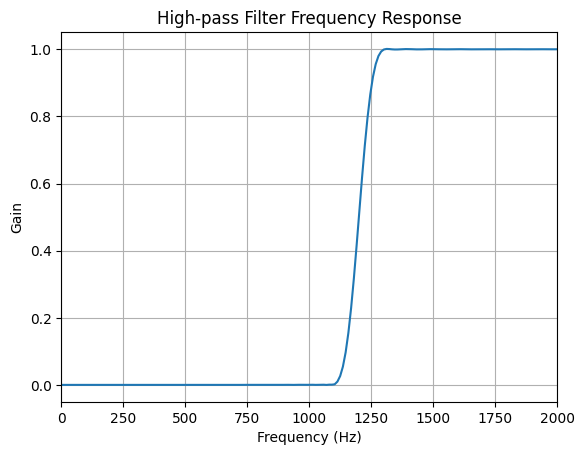

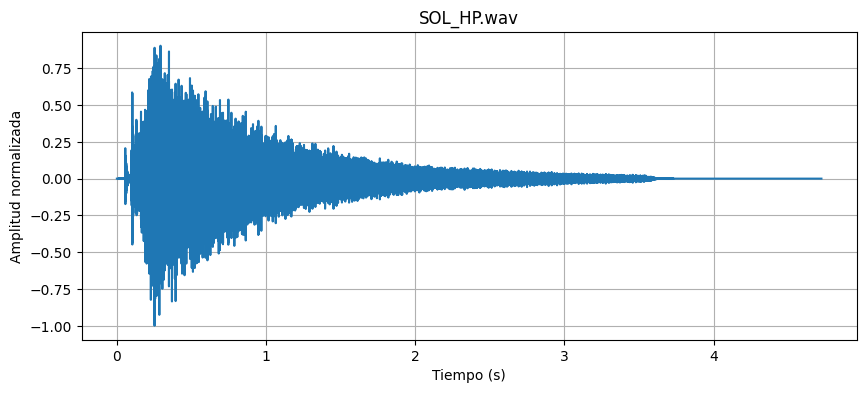

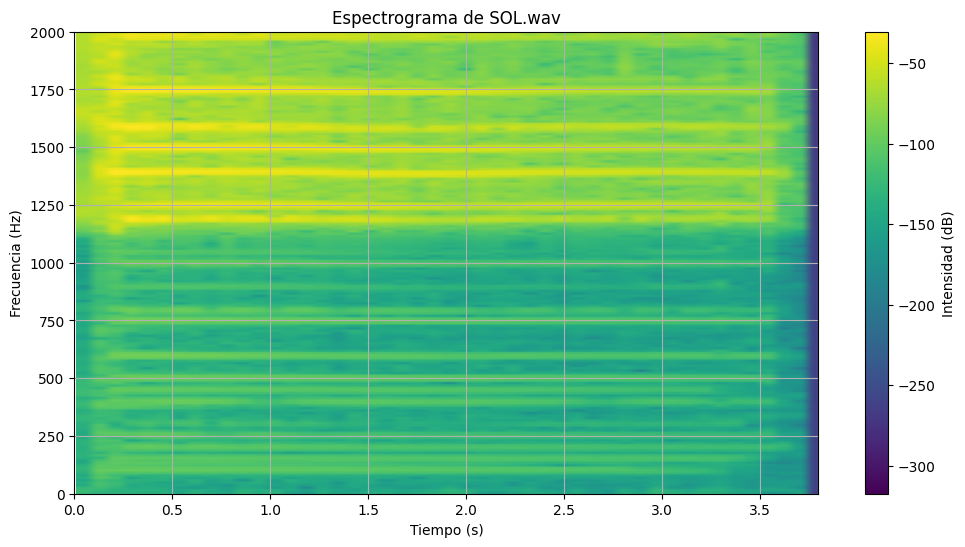

In [12]:
# Parameters

cutoff_hz = 1200.0  # Cutoff frequency
roll_off = 200.0  # Roll-off frequency

# Create the FIR filter
taps = firwin(N, cutoff_hz / nyq_rate, window=('kaiser', beta), pass_zero=False)

# Compute frequency response
w, h = freqz(taps, worN=2000)

# Plot frequency response
plt.plot(nyq_rate * w / np.pi, np.abs(h))
plt.title('High-pass Filter Frequency Response')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Gain')
plt.xlim(0, 2000)
plt.grid(True)
plt.show()

filtered_hp = lfilter(taps, 1.0, audio_data)

# Normalizar el audio
normalized_audio_hp = filtered_hp / np.max(np.abs(filtered_hp))

# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio_hp)) / fs

# Graficar el audio
plt.figure(figsize=(10, 4))
plt.plot(time_vector, normalized_audio_hp)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud normalizada")
plt.title("SOL_HP.wav")
plt.grid(True)
plt.show()

# Reproducir el audio
Audio(normalized_audio_hp, rate=fs)

# Crear un vector de tiempo correspondiente
time_vector = np.arange(len(normalized_audio_hp)) / fs



# Calcular y graficar el espectrograma
plt.figure(figsize=(12, 6))  # Aumentar el tamaño de la figura
plt.specgram(normalized_audio_hp, Fs=fs, NFFT=4096, noverlap=512, cmap='viridis')
plt.ylim(0, 2000)  # Mostrar frecuencias de 0 a 5000 Hz
plt.xlim(0,3.8)
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia (Hz)")
plt.title("Espectrograma de SOL.wav")
plt.colorbar(label='Intensidad (dB)')
plt.grid(True)
plt.show()

# Reproducir el audio
Audio(normalized_audio_hp, rate=fs)

## 4. Comparaciones entre señal original y filtradas

In [13]:
min_length = min(len(normalized_audio), len(normalized_audio_lp), len(normalized_audio_bp), len(normalized_audio_hp))
normalized_audio = normalized_audio[:min_length]
normalized_audio_lp = normalized_audio_lp[:min_length]
normalized_audio_bp = normalized_audio_bp[:min_length]
normalized_audio_hp = normalized_audio_hp[:min_length]

corr_coeff_lp = np.corrcoef(normalized_audio, normalized_audio_lp)[0, 1]
corr_coeff_bp = np.corrcoef(normalized_audio, normalized_audio_bp)[0, 1]
corr_coeff_hp = np.corrcoef(normalized_audio, normalized_audio_hp)[0, 1]

print(f"Pearson Correlation Coefficient (Low-pass): {corr_coeff_lp:.2f}")
print(f"Pearson Correlation Coefficient (Band-pass): {corr_coeff_bp:.2f}")
print(f"Pearson Correlation Coefficient (High-pass): {corr_coeff_hp:.2f}")

Pearson Correlation Coefficient (Low-pass): -0.23
Pearson Correlation Coefficient (Band-pass): 0.03
Pearson Correlation Coefficient (High-pass): -0.03


Una mayor correlación en la banda baja indica que la mayor parte de la información relevante del acorde está dada por sus componentes más graves. A esto hay que sumar el hecho de que las frecuencias más altas suelen atenuarse con mayor facilidad, a diferencia de la señal original que tiene una mayor duración (observe y haga comparación visual entre las duraciones de la señal filtrada con pasa-altos y la señal original). Dicho de otro modo, en la banda de 0 Hz a 600 Hz, hay la mayor parte de la energía y de las componentes espectrales mas aportantes, tal y como se hacía evidente en el espectrograma y en la FFT. En la banda media, de 600 Hz a 1200 Hz y en la banda alta, a partir de 1200 Hz, las componentes armónicas son menos y con significan un menor aporte energético respecto a la señal original. Sin embargo, vemos que la correlación en el mejor de los casos, que vendría siendo el caso del filtro pasa-bajas, elimina tanta información de la señal tal que la correlación no llega ni a 1/4 de la máxima posible, o dicho de otro modo, la señal resultante se correlaciona un 23% aproximadamente a la señal original. Esto deja en evidencia la gran riqueza en frecuencias que tiene la señal original, y se infiere que aumentando la frecuencia de corte del filtro pasa-bajas, obtendríamos una señal filtrada más similar a la señal original.

## 5. Diseño teórico, método de enventanado
Se utilizó una ventana Hamming y el cálculo de los coeficientes se realizó mediante las ecuaciones correspondientes, con la ayuda de software

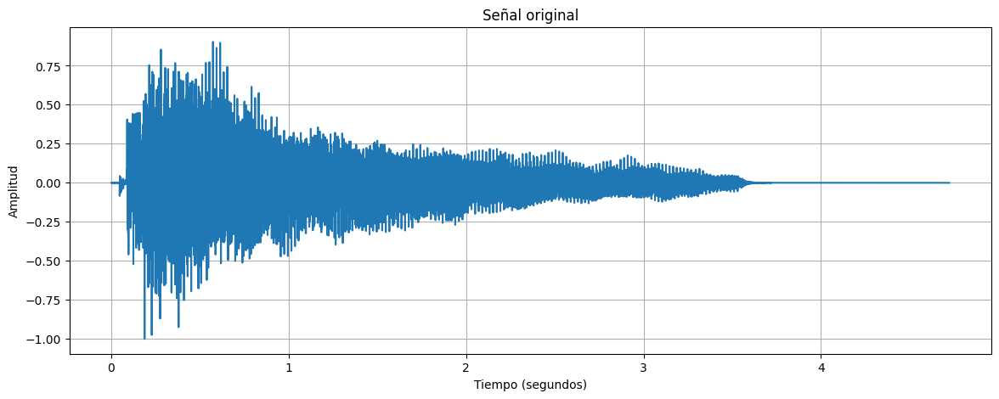

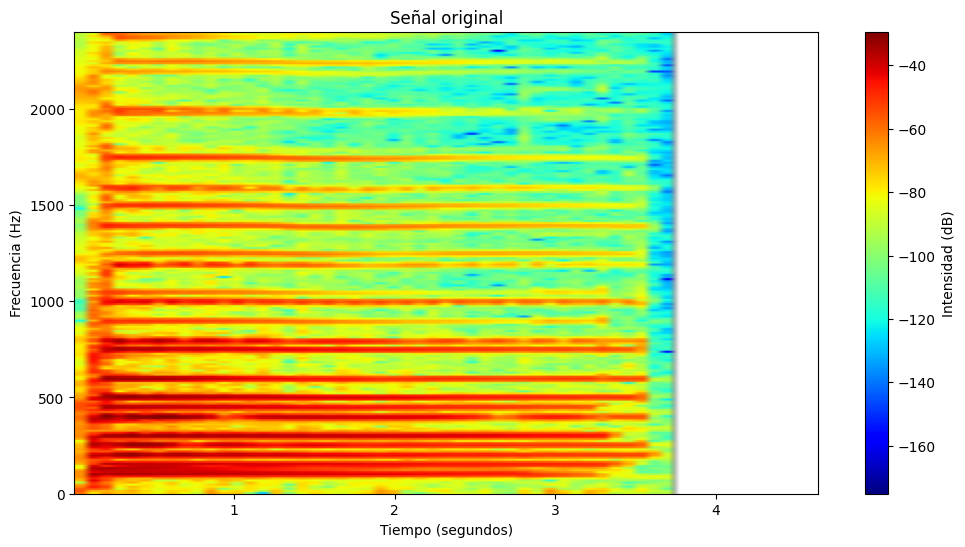

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from IPython.display import Audio

fs, audio_data = wavfile.read('SOL.wav')

audio_data = audio_data / np.max(np.abs(audio_data))

plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(audio_data)) / float(fs), audio_data)
plt.title('Señal original')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 6))
plt.specgram(audio_data, Fs=fs, NFFT=4096, noverlap=512, cmap='jet')
plt.title('Señal original')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='Intensidad (dB)')
plt.ylim(0, 2400)
plt.show()

Audio(audio_data, rate=fs)



### Primero, el pasa-bajas

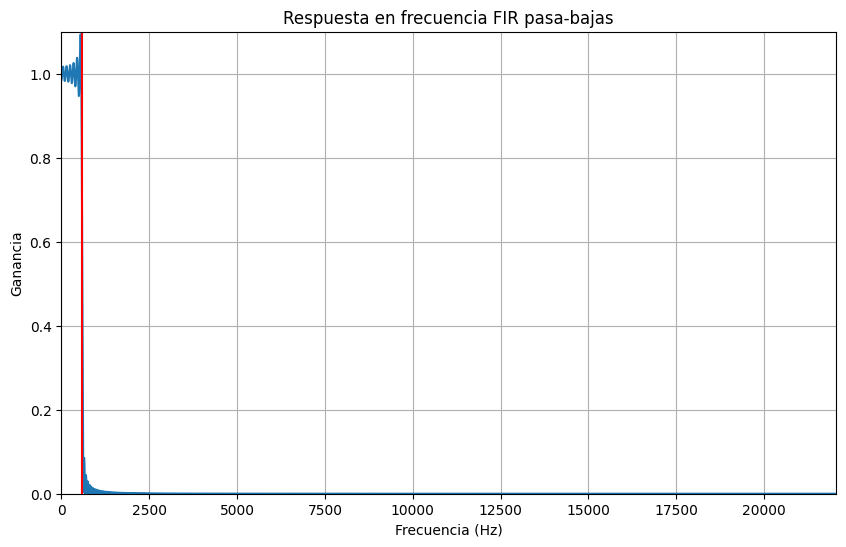

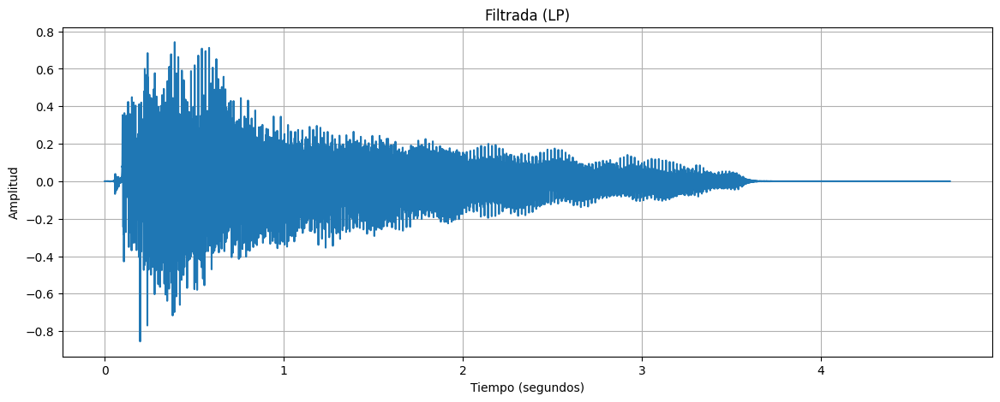

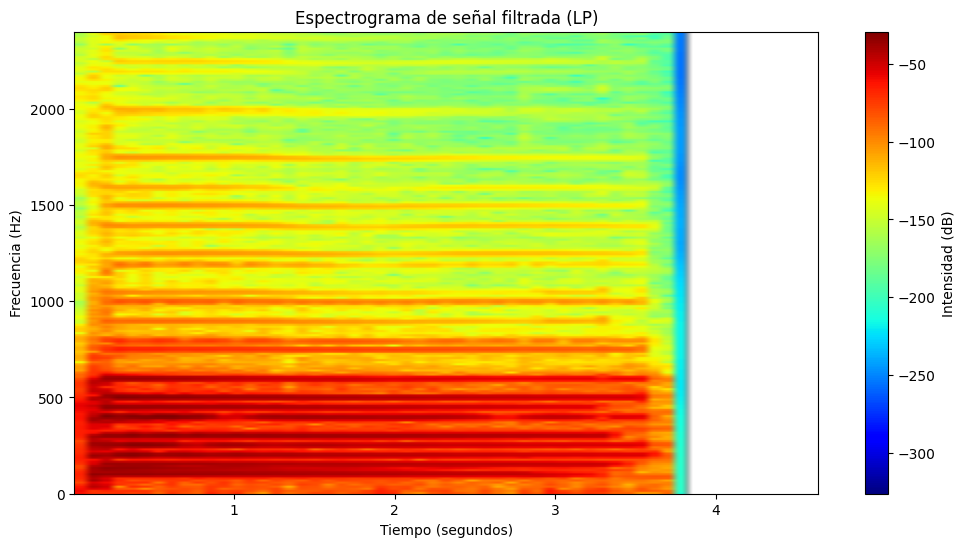

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import freqz, lfilter
from IPython.display import Audio

fs, audio_data = wavfile.read('SOL.wav')


audio_data = audio_data / np.max(np.abs(audio_data))


fc = 600.0
wc = 2 * np.pi * fc / fs

# Filter length
filter_length = int(4 * fs / 200)

n = np.arange(filter_length)
h = np.zeros(filter_length)

for i in range(filter_length):
    if i == (filter_length - 1) // 2:
        h[i] = 2 * (fc / fs)
    else:
        h[i] = 2 * (fc / fs) * np.sinc(2 * fc * (i - (filter_length - 1) / 2) / fs)


w, H = freqz(h, 1, worN=8000, fs=fs)
freq = w

plt.figure(figsize=(10, 6))
plt.plot(freq, np.abs(H))
plt.title('Respuesta en frecuencia FIR pasa-bajas')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Ganancia')
plt.grid(True)
plt.xlim(0, fs / 2)
plt.ylim(0, 1.1)
plt.axvline(fc, color='r')
plt.show()

# Apply the filter
filtered_audio = lfilter(h, 1, audio_data)

plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(filtered_audio)) / float(fs), filtered_audio)
plt.title('Filtrada (LP)')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 6))
plt.specgram(filtered_audio, Fs=fs, NFFT=4096, noverlap=512, cmap='jet')
plt.title('Espectrograma de señal filtrada (LP)')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='Intensidad (dB)')
plt.ylim(0, 2400)
plt.show()


Audio(filtered_audio, rate=fs)


### Ahora el pasa-altas

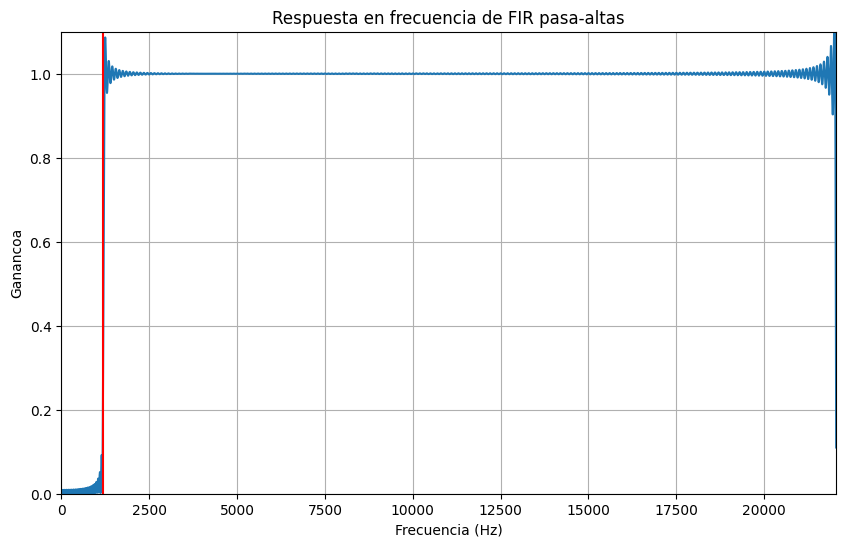

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import freqz, lfilter


fs, audio_data = wavfile.read('SOL.wav')


audio_data = audio_data / np.max(np.abs(audio_data))


fc_hp = 1200.0
wc_hp = 2 * np.pi * fc_hp / fs


filter_length_hp = (4*(fs)/200)
n_hp = np.arange(filter_length_hp)
h_hp = np.sinc(n_hp - (filter_length_hp - 1) / 2) - wc_hp / np.pi * np.sinc(wc_hp * (n_hp - (filter_length_hp - 1) / 2) / np.pi)

w_hp, H_hp = freqz(h_hp, 1, worN=8000, fs=fs)
freq_hp = w_hp

plt.figure(figsize=(10, 6))
plt.plot(freq_hp, np.abs(H_hp))
plt.title('Respuesta en frecuencia de FIR pasa-altas')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Ganancoa')
plt.grid(True)
plt.xlim(0, fs / 2)
plt.ylim(0, 1.1)
plt.axvline(fc_hp, color='r')
plt.show()


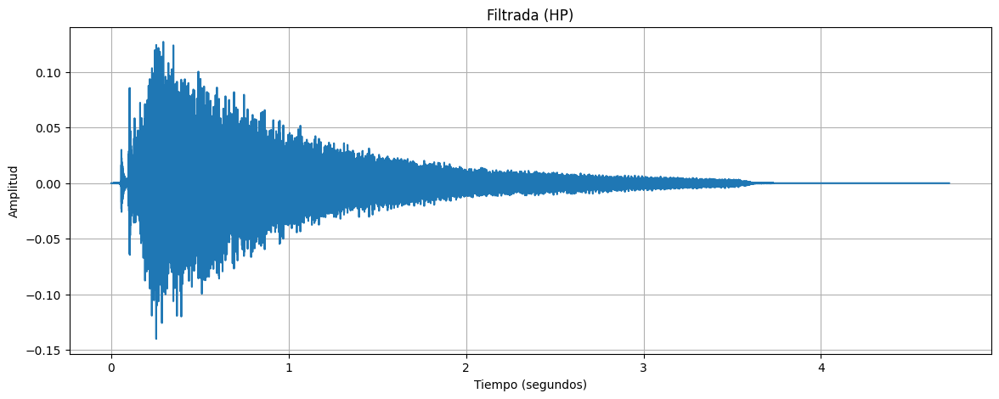

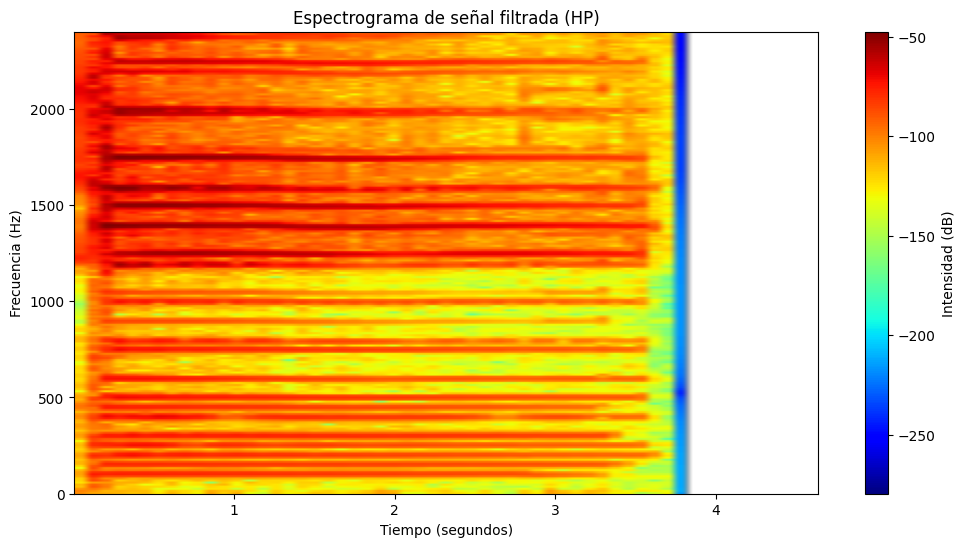

In [18]:

filtered_audio_hp = lfilter(h_hp, 1, audio_data)


plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(filtered_audio_hp)) / float(fs), filtered_audio_hp)
plt.title('Filtrada (HP)')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 6))
plt.specgram(filtered_audio_hp, Fs=fs, NFFT=4096, noverlap=512, cmap='jet')
plt.title('Espectrograma de señal filtrada (HP)')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='Intensidad (dB)')
plt.ylim(0, 2400)


Audio(filtered_audio_hp, rate=fs)


### Ahora el pasa-bandas

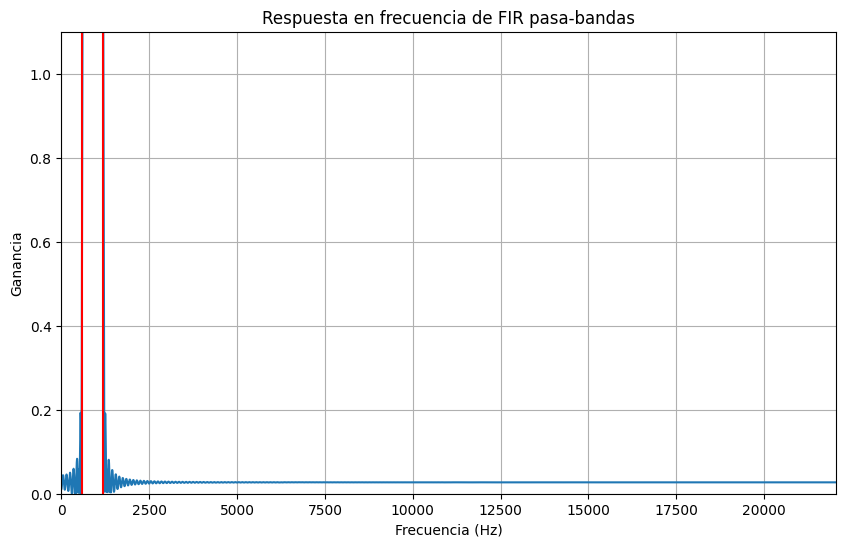

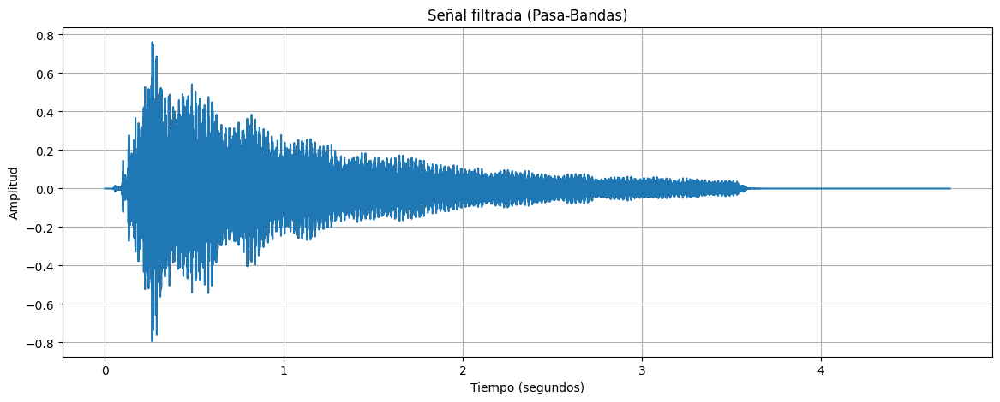

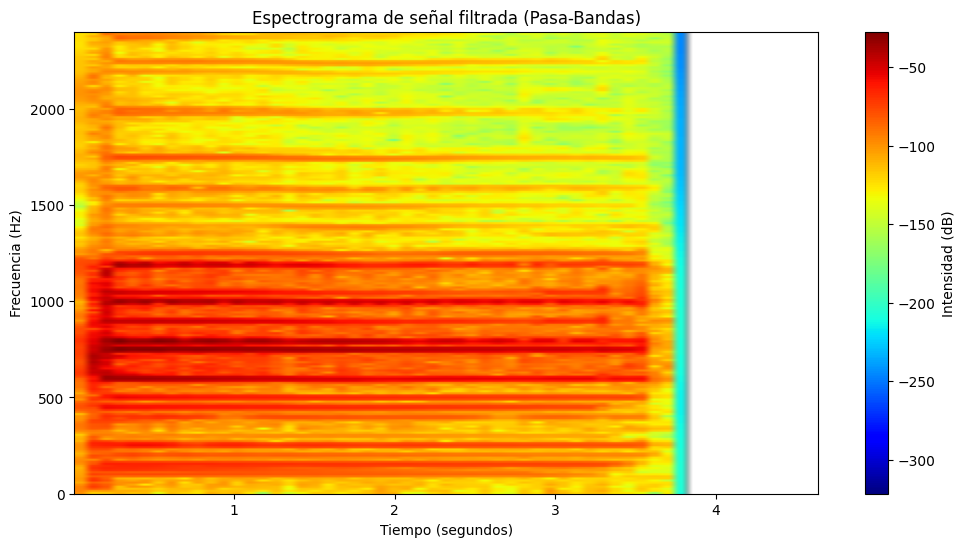

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import freqz, lfilter


fs, audio_data = wavfile.read('SOL.wav')

audio_data = audio_data / np.max(np.abs(audio_data))


fc1 = 600.0
fc2 = 1200.0
wc1 = 2 * np.pi * fc1 / fs
wc2 = 2 * np.pi * fc2 / fs


filter_length_bp = int(4 * fs / 200)

n_bp = np.arange(filter_length_bp)
h_bp = np.zeros(filter_length_bp)

for n in range(filter_length_bp):
    if n == (filter_length_bp - 1) // 2:
        h_bp[n] = 2 * (fc2 - fc1) / fs
    else:
        h_bp[n] = (2 * (np.sin(wc2 * (n - (filter_length_bp - 1) / 2)) - np.sin(wc1 * (n - (filter_length_bp - 1) / 2))) /
                   (np.pi * (n - (filter_length_bp - 1) / 2)))


w_bp, H_bp = freqz(h_bp, 1, worN=8000, fs=fs)
freq_bp = w_bp

plt.figure(figsize=(10, 6))
plt.plot(freq_bp, np.abs(H_bp))
plt.title('Respuesta en frecuencia de FIR pasa-bandas')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Ganancia')
plt.grid(True)
plt.xlim(0, fs / 2)
plt.ylim(0, 1.1)
plt.axvline(fc1, color='r')
plt.axvline(fc2, color='r')
plt.show()

# Apply the filter
filtered_audio_bp = lfilter(h_bp, 1, audio_data)


plt.figure(figsize=(14, 5))
plt.plot(np.arange(len(filtered_audio_bp)) / float(fs), filtered_audio_bp)
plt.title('Señal filtrada (Pasa-Bandas)')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 6))
plt.specgram(filtered_audio_bp, Fs=fs, NFFT=4096, noverlap=512, cmap='jet')
plt.title('Espectrograma de señal filtrada (Pasa-Bandas)')
plt.xlabel('Tiempo (segundos)')
plt.ylabel('Frecuencia (Hz)')
plt.colorbar(label='Intensidad (dB)')
plt.ylim(0, 2400)
plt.show()


Audio(filtered_audio_bp, rate=fs)



## 6. Comparaciones entre señales filtradas y original

In [20]:
min_length = min(len(audio_data), len(filtered_audio), len(filtered_audio_bp), len(filtered_audio_hp))
audio_data = audio_data[:min_length]
filtered_audio = filtered_audio[:min_length]
filtered_audio_hp = filtered_audio_hp[:min_length]
filtered_audio_bp = filtered_audio_bp[:min_length]

corr_coeff_lp = np.corrcoef(audio_data, filtered_audio)[1, 0]
corr_coeff_bp = np.corrcoef(audio_data, filtered_audio_bp)[1, 0]
corr_coeff_hp = np.corrcoef(audio_data, filtered_audio_hp)[1, 0]

print(f"Coeficiente de correlación de Pearson (pasa-bajas): {corr_coeff_lp:.2f}")
print(f"Coeficiente de correlación de Pearson (pasa-bandas): {corr_coeff_bp:.2f}")
print(f"Coeficiente de correlación de Pearson (pasa-altas): {corr_coeff_hp:.2f}")

Coeficiente de correlación de Pearson (pasa-bajas): 0.46
Coeficiente de correlación de Pearson (pasa-bandas): 0.04
Coeficiente de correlación de Pearson (pasa-altas): 0.10


Se presenta un escenario similar al de los filtros por funciones de laboratorio. En este caso la mayor correlación la presenta la señal con filtro pasa-bajas. Es esperable dada, nuevamente, la alta concentración de energía de la señal en el rango de frecuencias inferior a los 600hz, por lo que dejar pasar estas frecuencias asegurará una mayor similidad en cualquiera de los casos. Ahora bien, la correlación del filtro pasabandas es sumamente baja. Sin embargo esto no quiere decir que el filtro esté mal o que la señal resultante no sea similar a la original, simplemente que la riqueza espectral de la señal se pierde en mayor medida y solo conserva la información suficiente como para que se perciba el mismo acorde en el oído humano. Hay que tener en cuenta que la percepción auditiva del humano no es algo equiparable al coefficiente de correlación de Pearson. Aunque las señales filtradas puedan sonar similares al oído humano (debido a características como la respuesta en frecuencia y la envolvente temporal), estas similitudes pueden no reflejarse en una correlación lineal alta. El sistema auditivo humano (o el cerebro) es complejo y puede percibir similitudes incluso cuando las relaciones lineales no son fuertes, pues se trata más de la identificación de un patrón y de estructura de los acordes. Un ejemplo claro es la escala DO, RE, MI, FA, SOL, LA, SI, DO. Si se la pones a cantar a personas distintas, probablemente acierten en separar cada nota una cierta cantidad de hercios, pero no acertarán siempre en la frecuencia inicial (algunos cantarán el DO en la frecuencia correcta, otros más arriba, otros más abajo).

Ahora bien, hay diferencias respecto al caso de laboratorio. Resulta llamativo como aumentó la correlación en el caso de la señal filtrada con pasa-altas. Este aumento podría deberse que el roll-off no es exactamente de 200hz y quizás sea algo mayor, permitiendo más componentes originales pasar sin atenuación. De hecho, esto mismo explicaría porque aumentó la correlación tambien en el pasa-bajas y de manera más notoria.